In [ ]:
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.preprocessing import OneHotEncoder
import sklearn
import seaborn as sns
from collections import Counter

In [ ]:

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


#Statistical Analysis and Data Cleaning

In [ ]:
df = pd.read_csv('/content/data.csv', delimiter = ";")

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4424 entries, 0 to 4423
Data columns (total 37 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Marital status                                  4424 non-null   int64  
 1   Application mode                                4424 non-null   int64  
 2   Application order                               4424 non-null   int64  
 3   Course                                          4424 non-null   int64  
 4   Daytime/evening attendance	                     4424 non-null   int64  
 5   Previous qualification                          4424 non-null   int64  
 6   Previous qualification (grade)                  4424 non-null   float64
 7   Nacionality                                     4424 non-null   int64  
 8   Mother's qualification                          4424 non-null   int64  
 9   Father's qualification                   

In [ ]:
df.describe()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,Mother's occupation,Father's occupation,Admission grade,Displaced,Educational special needs,Debtor,Tuition fees up to date,Gender,Scholarship holder,Age at enrollment,International,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP
count,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000
mean,1.178571,18.669078,1.727848,8856.642631,0.890823,4.577758,132.613314,1.873192,19.561935,22.275316,10.960895,11.032324,126.978119,0.548373,0.011528,0.113698,0.880651,0.351718,0.248418,23.265145,0.024864,0.709991,6.270570,8.299051,4.706600,10.640822,0.137658,0.541817,6.232143,8.063291,4.435805,10.230206,0.150316,11.566139,1.228029,0.001969
std,0.605747,17.484682,1.313793,2063.566416,0.311897,10.216592,13.188332,6.914514,15.603186,15.343108,26.418253,25.263040,14.482001,0.497711,0.106760,0.317480,0.324235,0.477560,0.432144,7.587816,0.155729,2.360507,2.480178,4.179106,3.094238,4.843663,0.690880,1.918546,2.195951,3.947951,3.014764,5.210808,0.753774,2.663850,1.382711,2.269935
min,1.000000,1.000000,0.000000,33.000000,0.000000,1.000000,95.000000,1.000000,1.000000,1.000000,0.000000,0.000000,95.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.600000,-0.800000,-4.060000
25%,1.000000,1.000000,1.000000,9085.000000,1.000000,1.000000,125.000000,1.000000,2.000000,3.000000,4.000000,4.000000,117.900000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,19.000000,0.000000,0.000000,5.000000,6.000000,3.000000,11.000000,0.000000,0.000000,5.000000,6.000000,2.000000,10.750000,0.000000,9.400000,0.300000,-1.700000
50%,1.000000,17.000000,1.000000,9238.000000,1.000000,1.000000,133.100000,1.000000,19.000000,19.000000,5.000000,7.000000,126.100000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,20.000000,0.000000,0.000000,6.000000,8.000000,5.000000,12.285714,0.000000,0.000000,6.000000,8.000000,5.000000,12.200000,0.000000,11.100000,1.400000,0.320000
75%,1.000000,39.000000,2.000000,9556.000000,1.000000,1.000000,140.000000,1.000000,37.000000,37.000000,9.000000,9.000000,134.800000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,25.000000,0.000000,0.000000,7.000000,10.000000,6.000000,13.400000,0.000000,0.000000,7.000000,10.000000,6.000000,13.333333,0.000000,13.900000,2.600000,1.790000
max,6.000000,57.000000,9.000000,9991.000000,1.000000,43.000000,190.000000,109.000000,44.000000,44.000000,194.000000,195.000000,190.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,70.000000,1.000000,20.000000,26.000000,45.000000,26.000000,18.875000,12.000000,19.000000,23.000000,33.000000,20.000000,18.571429,12.000000,16.200000,3.700000,3.510000


In [ ]:

df.columns

Index(['Marital status', 'Application mode', 'Application order', 'Course',
       'Daytime/evening attendance\t', 'Previous qualification',
       'Previous qualification (grade)', 'Nacionality',
       'Mother's qualification', 'Father's qualification',
       'Mother's occupation', 'Father's occupation', 'Admission grade',
       'Displaced', 'Educational special needs', 'Debtor',
       'Tuition fees up to date', 'Gender', 'Scholarship holder',
       'Age at enrollment', 'International',
       'Curricular units 1st sem (credited)',
       'Curricular units 1st sem (enrolled)',
       'Curricular units 1st sem (evaluations)',
       'Curricular units 1st sem (approved)',
       'Curricular units 1st sem (grade)',
       'Curricular units 1st sem (without evaluations)',
       'Curricular units 2nd sem (credited)',
       'Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (evaluations)',
       'Curricular units 2nd sem (approved)',
       'Curricular units 2nd

In [ ]:
df.head(3)

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,Mother's occupation,Father's occupation,Admission grade,Displaced,Educational special needs,Debtor,Tuition fees up to date,Gender,Scholarship holder,Age at enrollment,International,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,17,5,171,1,1,122.0,1,19,12,5,9,127.3,1,0,0,1,1,0,20,0,0,0,0,0,0.0,0,0,0,0,0,0.000000,0,10.8,1.4,1.74,Dropout
1,1,15,1,9254,1,1,160.0,1,1,3,3,3,142.5,1,0,0,0,1,0,19,0,0,6,6,6,14.0,0,0,6,6,6,13.666667,0,13.9,-0.3,0.79,Graduate
2,1,1,5,9070,1,1,122.0,1,37,37,9,9,124.8,1,0,0,0,1,0,19,0,0,6,0,0,0.0,0,0,6,0,0,0.000000,0,10.8,1.4,1.74,Dropout


<Axes: xlabel='Target', ylabel='count'>

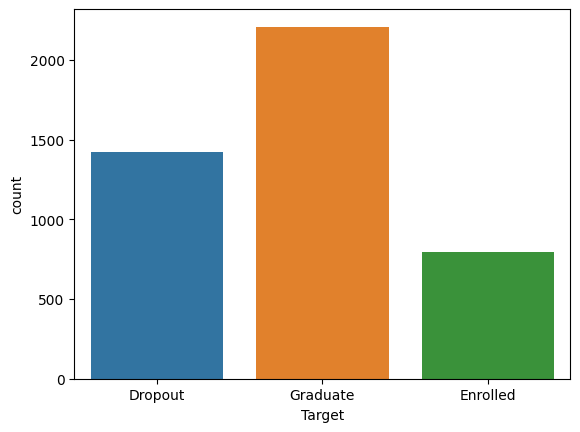

In [ ]:
sns.countplot(x = 'Target', data = df)

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
Glyph 9 (	) missing from current font.


<Axes: >

Glyph 9 (	) missing from current font.
Glyph 9 (	) missing from current font.


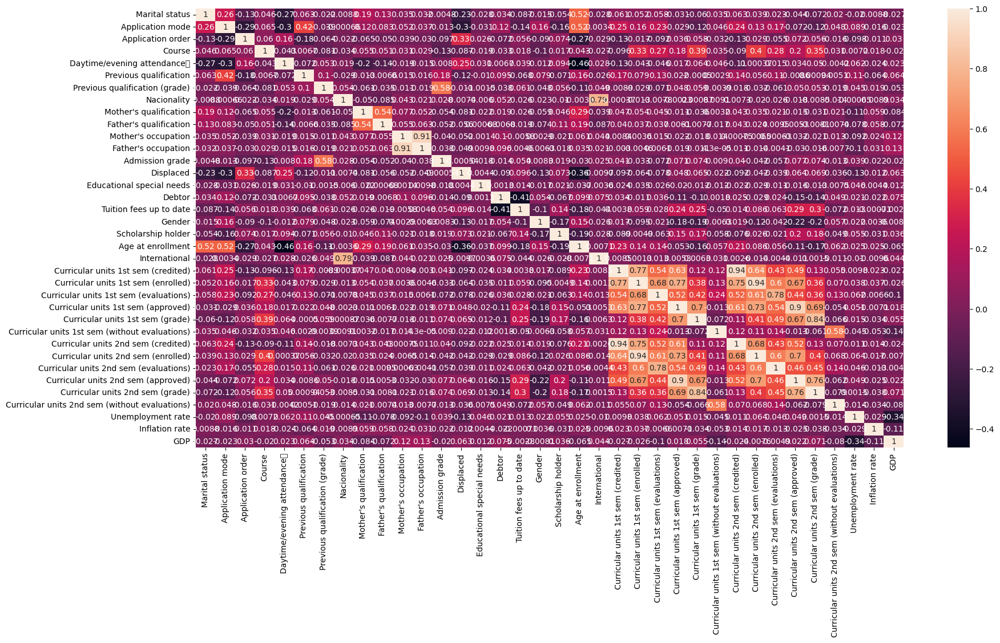

In [ ]:
import seaborn as sns
import matplotlib as pyplot
cor = df.corr()
plt.figure(figsize = (20,10))
sns.heatmap(cor, annot = True)


#Feature Selection

In [ ]:
df["Target"].replace({"Dropout": 0,"Graduate": 1, "Enrolled": 2}, inplace=True)

<ipython-input-32-abeb3f1327ef>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["Target"].replace({"Dropout": 0,"Graduate": 1, "Enrolled": 2}, inplace=True)
<ipython-input-32-abeb3f1327ef>:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df["Target"].replace({"Dropout": 0,"Graduate": 1, "Enrolle

In [ ]:
x = df.drop(['Target'],axis=1)
y = df['Target']

In [ ]:
print(y.head(0))

Series([], Name: Target, dtype: int64)


In [ ]:
print(y)

0       0
1       1
2       0
3       1
4       1
5       1
6       1
7       0
8       1
9       0
10      1
11      1
12      0
13      1
14      1
15      0
16      2
17      1
18      1
19      2
20      1
21      2
22      1
23      1
24      1
25      2
26      1
27      2
28      1
29      2
30      2
31      1
32      2
33      1
34      1
35      0
36      0
37      0
38      1
39      0
40      0
41      1
42      1
43      0
44      0
45      2
46      1
47      1
48      1
49      1
50      1
51      2
52      2
53      1
54      0
55      1
56      0
57      0
58      1
59      2
60      1
61      1
62      2
63      2
64      2
65      0
66      1
67      1
68      0
69      2
70      2
71      1
72      0
73      0
74      1
75      0
76      0
77      1
78      1
79      1
80      0
81      0
82      0
83      2
84      1
85      1
86      1
87      1
88      2
89      2
90      0
91      1
92      0
93      0
94      1
95      2
96      1
97      1
98      2
99      0


The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
Glyph 9 (	) missing from current font.
Glyph 9 (	) missing from current font.


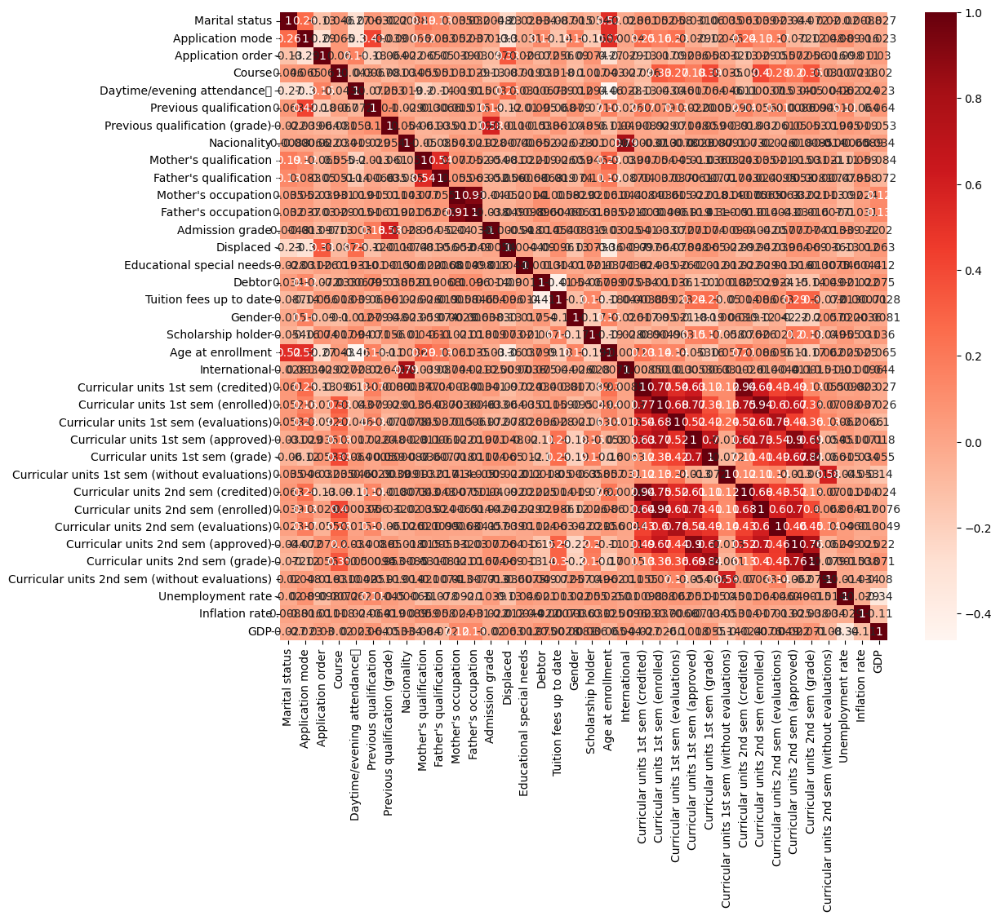

In [ ]:
#Using Pearson Correlation
plt.figure(figsize=(12,10))
cor = df.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [ ]:
#Correlation with output variable
#cor_target = abs(cor['Target'])
#Selecting highly correlated features
#relevant_features = cor_target[cor_target>0.1]
#relevant_features

<ipython-input-30-1e05d09a06e5>:33: UserWarning: Glyph 9 (	) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


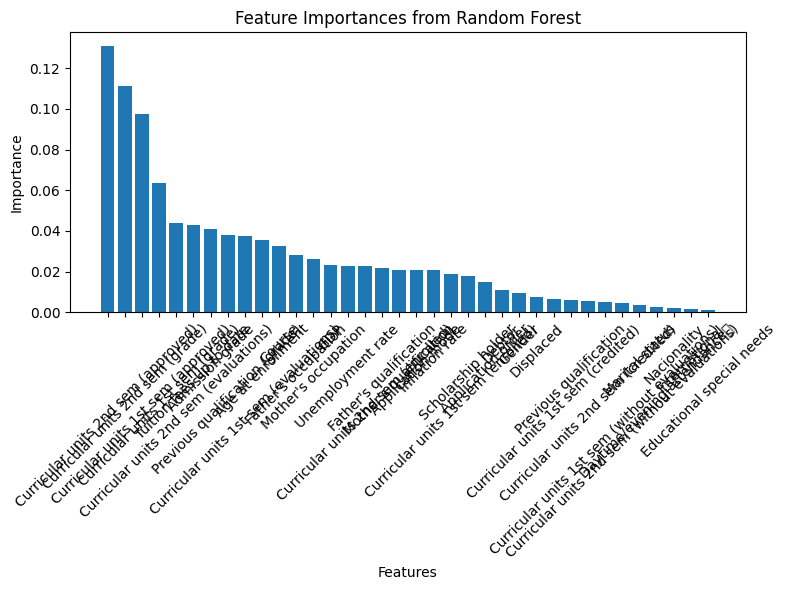

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Train the Random Forest model on the training data
rf_classifier.fit(X_train, y_train)

# Get feature importances from the trained model
feature_importances = rf_classifier.feature_importances_

# Create a DataFrame to store feature importances with their respective column names
importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importances})

# Sort features based on their importance (descending order)
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(importance_df['Feature'], importance_df['Importance'])
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances from Random Forest')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()








Mutual Information Scores:
                                           Feature  Mutual Information
30             Curricular units 2nd sem (approved)            0.314908
24             Curricular units 1st sem (approved)            0.259187
31                Curricular units 2nd sem (grade)            0.247566
25                Curricular units 1st sem (grade)            0.194892
23          Curricular units 1st sem (evaluations)            0.100517
29          Curricular units 2nd sem (evaluations)            0.095157
16                         Tuition fees up to date            0.090725
22             Curricular units 1st sem (enrolled)            0.068007
19                               Age at enrollment            0.060391
3                                           Course            0.057941
18                              Scholarship holder            0.053806
1                                 Application mode            0.052335
28             Curricular units 2nd sem (enrolled)

<ipython-input-31-8aa68de565a6>:39: UserWarning: Glyph 9 (	) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


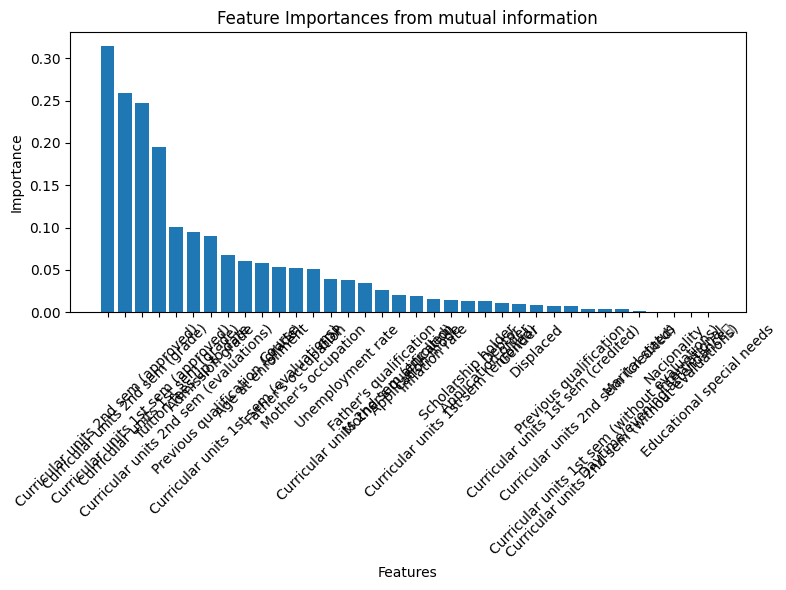

In [ ]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_iris
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import train_test_split



# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Calculate the mutual information between each feature and the target
mutual_info_scores = mutual_info_classif(X_train, y_train)

# Create a DataFrame to store the mutual information scores with their respective column names
mi_df = pd.DataFrame({'Feature': x.columns, 'Mutual Information': mutual_info_scores})

# Sort features based on their mutual information scores (descending order)
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

# Print the mutual information scores for each feature
print("Mutual Information Scores:")
print(mi_df)

# Select the top-K features based on mutual information scores
K = 2
top_K_features = mi_df['Feature'][:K]

print(f"\nTop-{K} features:")
print(top_K_features)

# Plot the bar graph
plt.figure(figsize=(8, 6))
plt.bar(importance_df['Feature'], mi_df['Mutual Information'])
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances from mutual information')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()





#Data Mining Algorithms

In [ ]:
x = df.drop(['Target'],axis=1)
y = df['Target']
print(x.shape)
print(y.shape)

(4424, 36)
(4424,)


In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2, stratify=y)
import imblearn
from imblearn.over_sampling import SMOTE
smote = SMOTE()
x_train,y_train = smote.fit_resample(x_train,y_train)



In [ ]:
from collections import Counter
counter = Counter(y_train)
print(counter)

Counter({0: 1767, 2: 1767, 1: 1767})


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
import numpy as np
from sklearn.metrics import precision_score
from sklearn.preprocessing import StandardScaler

In [ ]:
K = []
training = []
test = []
scores = {}
for k in range(2, 21):

    clf = KNeighborsClassifier(n_neighbors = k)
    clf.fit(x_train, y_train)

    training_score = clf.score(x_train, y_train)
    test_score = clf.score(x_test, y_test)


    K.append(k)

    training.append(training_score)
    test.append(test_score)
    scores[k] = [training_score, test_score]

for keys, values in scores.items():
    print(keys, ':', values)
test.sort()

# printing the last element
print("Largest element is:", test[-1])

2 : [0.9298245614035088, 0.5615819209039548]
3 : [0.8724768911526127, 0.5401129943502825]
4 : [0.8466327108092813, 0.5446327683615819]
5 : [0.8107904169024712, 0.5502824858757062]
6 : [0.7866440294284097, 0.5525423728813559]
7 : [0.7670250896057348, 0.5435028248587571]
8 : [0.7570269760422562, 0.5627118644067797]
9 : [0.7409922656102622, 0.5435028248587571]
10 : [0.7247689115261271, 0.5502824858757062]
11 : [0.7130730050933786, 0.5491525423728814]
12 : [0.7009998113563478, 0.5548022598870056]
13 : [0.6928881343142803, 0.5344632768361582]
14 : [0.6883606866628937, 0.5344632768361582]
15 : [0.6823240897943784, 0.5310734463276836]
16 : [0.6745897000565931, 0.5276836158192091]
17 : [0.672514619883041, 0.5333333333333333]
18 : [0.6623278626674213, 0.5299435028248588]
19 : [0.6568571967553292, 0.5299435028248588]
20 : [0.6527070364082249, 0.5299435028248588]
Largest element is: 0.5627118644067797


In [ ]:
from sklearn import metrics
from sklearn.metrics import precision_score
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
K = []
training = []
test = []
scores = {}
precision = []

clf = KNeighborsClassifier(n_neighbors = 8)
clf.fit(x_train, y_train)

y_pred = clf.predict(x_test)

test_score = (metrics.accuracy_score(y_test, y_pred))
f1 = (sklearn.metrics.f1_score(y_test, y_pred, average = 'macro'))
p = (sklearn.metrics.precision_score(y_test, y_pred, average = 'macro'))
r = (sklearn.metrics.recall_score(y_test, y_pred, average = 'macro'))
print(test_score)
print(f1)
print(p)
print(r)





0.5627118644067797
0.535413668329049
0.5417948589523304
0.5492408619450561


In [ ]:
import sklearn

from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import balanced_accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
# Create Decision Tree classifer object
max_depth = [1, 10, 20, 50, 100, 150, 200]
 #A = range(1,6)
test_score = []
from sklearn.metrics import balanced_accuracy_score
import numpy as np
from sklearn.metrics import precision_recall_fscore_support
f1 = []
p = []
r = []
for i in max_depth:

        clf = DecisionTreeClassifier(criterion="entropy", max_depth=i, min_samples_split=15, min_samples_leaf=2, max_features=11)

# Train Decision Tree Classifer
        clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
        y_pred = clf.predict(x_test)
        test_score.append(metrics.accuracy_score(y_test, y_pred))
        f1.append(sklearn.metrics.f1_score(y_test, y_pred, average = 'macro'))
        p.append(sklearn.metrics.precision_score(y_test, y_pred, average = 'macro'))
        r.append(sklearn.metrics.recall_score(y_test, y_pred, average = 'macro'))





print(test_score)
print(f1)
print(p)
print(r)

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[0.5988700564971752, 0.6824858757062147, 0.6926553672316385, 0.6779661016949152, 0.6813559322033899, 0.6915254237288135, 0.6813559322033899]
[0.3973655891437116, 0.637560426235856, 0.6457599605897862, 0.6184432670379442, 0.6259604758741929, 0.6346927444570998, 0.6112342285905342]
[0.47695184553411973, 0.6445440473703121, 0.6452660602109292, 0.6175363410408977, 0.6240737609814635, 0.6333978346501471, 0.6104614177344461]
[0.4387175238459415, 0.6426049490641259, 0.6525815583904405, 0.6202095514166609, 0.6290162262360602, 0.6372294497226108, 0.6124056012560178]


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.metrics import classification_report
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.metrics import balanced_accuracy_score


model = RandomForestClassifier(n_estimators=210, max_depth=180, max_features=11)



model.fit(x_train, y_train)
y_pred = clf.predict(x_test)
test_score = (metrics.accuracy_score(y_test, y_pred))
f1 = (sklearn.metrics.f1_score(y_test, y_pred, average='macro'))
p = (sklearn.metrics.precision_score(y_test, y_pred, average='macro'))
r = (sklearn.metrics.recall_score(y_test, y_pred, average='macro'))

print(test_score)
print(f1)
print(p)
print(r)

0.6813559322033899
0.6112342285905342
0.6104614177344461
0.6124056012560178


In [ ]:
from sklearn.linear_model import LogisticRegression
#Balanced class weight, penalty = l1
learner = LogisticRegression(fit_intercept = True, penalty = 'l1', solver='liblinear', class_weight='balanced')
learner.fit(x_train, y_train)
tr_pred = learner.predict(x_train)
predictions = learner.predict(x_test)


y_pred = learner.predict(x_test)
test_score = (metrics.accuracy_score(y_test, y_pred))
f1 = (sklearn.metrics.f1_score(y_test, y_pred, average='macro'))
p = (sklearn.metrics.precision_score(y_test, y_pred, average='macro'))
r = (sklearn.metrics.recall_score(y_test, y_pred, average='macro'))
print(test_score)
print(f1)
print(p)
print(r)

0.7706214689265537
0.7226294296788484
0.72735891580847
0.7227394170462124


In [ ]:
from sklearn.neural_network import MLPClassifier
learner = MLPClassifier(hidden_layer_sizes=(200,), alpha=0.1, learning_rate="adaptive", activation='tanh', solver='adam', max_iter=500)
learner.fit(x_train, y_train)
tr_pred = learner.predict(x_train)
predictions = learner.predict(x_test)


y_pred = learner.predict(x_test)
test_score = (metrics.accuracy_score(y_test, y_pred))
f1 = (sklearn.metrics.f1_score(y_test, y_pred, average='macro'))
p = (sklearn.metrics.precision_score(y_test, y_pred, average='macro'))
r = (sklearn.metrics.recall_score(y_test, y_pred, average='macro'))
print(test_score)
print(f1)
print(p)
print(r)

0.5084745762711864
0.2670119367487788
0.49698449915331505
0.3501899632138334


In [ ]:
import xgboost as xgb #importing xgboost model from xgb library
xgc = xgb.XGBClassifier(n_estimators=500, max_depth=5, random_state=42) # Creating a XGB Classifier

xgc.fit(x_train, y_train)
y_pred = xgc.predict(x_test)
test_score = (metrics.accuracy_score(y_test, y_pred))
f1 = (sklearn.metrics.f1_score(y_test, y_pred, average='macro'))
p = (sklearn.metrics.precision_score(y_test, y_pred, average='macro'))
r = (sklearn.metrics.recall_score(y_test, y_pred, average='macro'))
print(test_score)
print(f1)
print(p)
print(r)

0.768361581920904
0.7067797770312559
0.7202230052612287
0.6984958261669584


In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


# Initialize the Gaussian Naive Bayes classifier
nb_classifier = GaussianNB()

# Train the Naive Bayes classifier
nb_classifier.fit(x_train, y_train)

# Make predictions on the test data
y_pred = nb_classifier.predict(x_test)

test_score = (metrics.accuracy_score(y_test, y_pred))
f1 = (sklearn.metrics.f1_score(y_test, y_pred, average='macro'))
p = (sklearn.metrics.precision_score(y_test, y_pred, average='macro'))
r = (sklearn.metrics.recall_score(y_test, y_pred, average='macro'))
print(test_score)
print(f1)
print(p)
print(r)

0.6813559322033899
0.6426429630493998
0.6452447981771969
0.6516679165652919


In [ ]:
from sklearn.ensemble import AdaBoostClassifier
adaboost_classifier = AdaBoostClassifier(n_estimators=50, random_state=42)

# Train the model on the training data
adaboost_classifier.fit(x_train, y_train)

# Make predictions on the testing data
predictions = adaboost_classifier.predict(x_test)

# Evaluate the accuracy of the model
accuracy = accuracy_score(y_test, predictions)

test_score = (metrics.accuracy_score(y_test, predictions))
f1 = (sklearn.metrics.f1_score(y_test, predictions, average = 'macro'))
p = (sklearn.metrics.precision_score(y_test, predictions, average = 'macro'))
r = (sklearn.metrics.recall_score(y_test, predictions, average = 'macro'))
print(test_score)
print(f1)
print(p)
print(r)

0.7581920903954802
0.7153639495863481
0.7188628184663268
0.7203997150418185


In [ ]:
# Split the data into training and testing sets
import numpy as np
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2, stratify=y)
import xgboost as xgb #importing xgboost model from xgb library
xgc = xgb.XGBClassifier(n_estimators=500, max_depth=5, random_state=42) # Creating a XGB Classifier

xgc.fit(x_train, y_train)
y_pred = xgc.predict(x_test)
test_score = (metrics.accuracy_score(y_test, y_pred))
f1 = (sklearn.metrics.f1_score(y_test, y_pred, average='macro'))
p = (sklearn.metrics.precision_score(y_test, y_pred, average='macro'))
r = (sklearn.metrics.recall_score(y_test, y_pred, average='macro'))
print(test_score)
print(f1)
print(p)
print(r)


0.7830508474576271
0.7063790699276646
0.7262343915496517
0.6977301881047328


#LIME

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 8.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=2007a83ae0b5c5128f6d4195af22f2eb8ef7050f501203e2d0228b5de47334b0
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import lime

In [ ]:
import lime
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    feature_names=x_train.columns,
    class_names=[0,1,2],
    mode='classification'
)

In [ ]:
exp = explainer.explain_instance(
    data_row=x_test.iloc[0],
    predict_fn=model.predict_proba
)

exp.show_in_notebook(show_table=True)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [ ]:
exp = explainer.explain_instance(
    data_row=x_test.iloc[10],
    predict_fn=model.predict_proba
)

exp.show_in_notebook(show_table=True)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [ ]:
exp = explainer.explain_instance(
    data_row=x_test.iloc[16],
    predict_fn=model.predict_proba
)

exp.show_in_notebook(show_table=True)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [ ]:
exp = explainer.explain_instance(
    data_row=x_test.iloc[94],
    predict_fn=model.predict_proba
)

exp.show_in_notebook(show_table=True)

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


#SHAP

In [ ]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 14.6 MB/s eta 0:00:00


In [ ]:
import shap

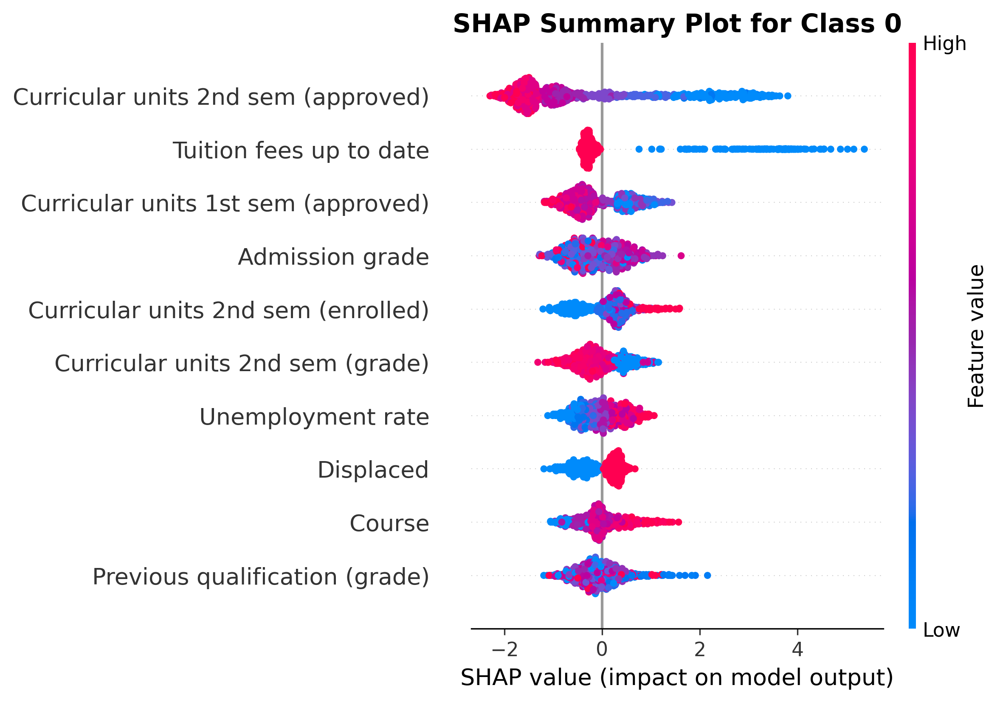

<Figure size 640x480 with 0 Axes>

In [ ]:
import shap
import matplotlib.pyplot as plt

# Assuming shap_values and X are already defined
n_classes = shap_values.shape[2]  # Number of classes

# Plot SHAP summary plot for each class
plt.figure(figsize=(10, 6), dpi=300)
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.size'] = 12
image1= shap.summary_plot(shap_values[:, :, 0], x_test, max_display=10, show=False)
plt.title(f"SHAP Summary Plot for Class {0}", fontweight='bold')
plt.show()
plt.savefig("shap_summary_class_0.png", bbox_inches="tight")

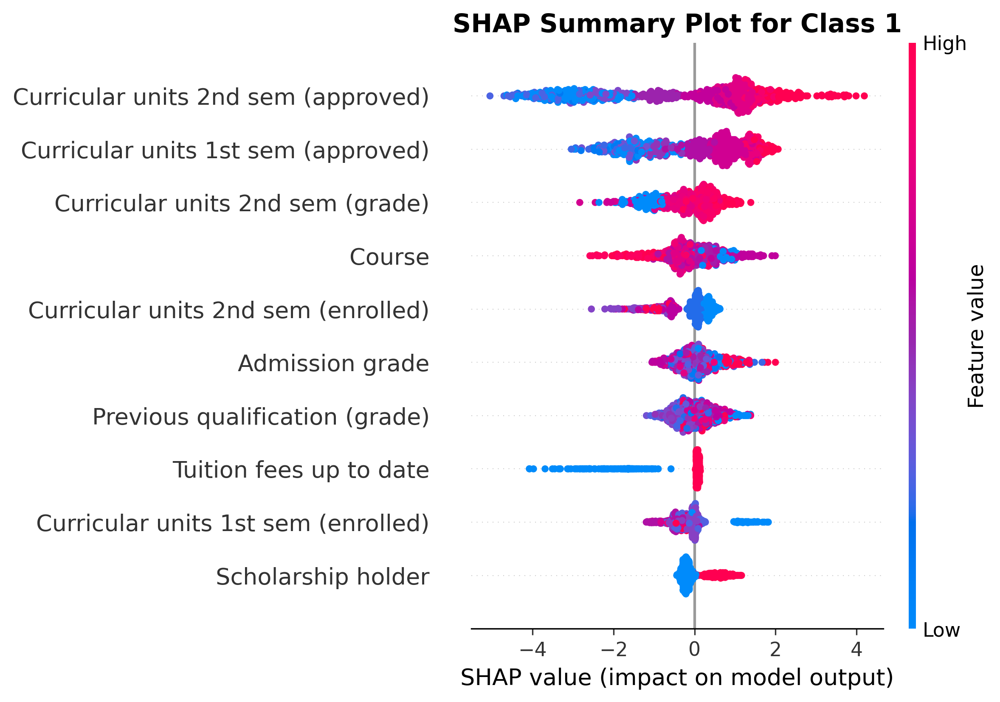

<Figure size 640x480 with 0 Axes>

In [ ]:
import shap
import matplotlib.pyplot as plt

# Assuming shap_values and X are already defined
n_classes = shap_values.shape[2]  # Number of classes

# Plot SHAP summary plot for each class
plt.figure(figsize=(10, 6), dpi=300)
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.size'] = 12
image1= shap.summary_plot(shap_values[:, :, 1], x_test, max_display=10, show=False)
plt.title(f"SHAP Summary Plot for Class {1}", fontweight='bold')
plt.show()
plt.savefig("shap_summary_class_1.png", bbox_inches="tight")

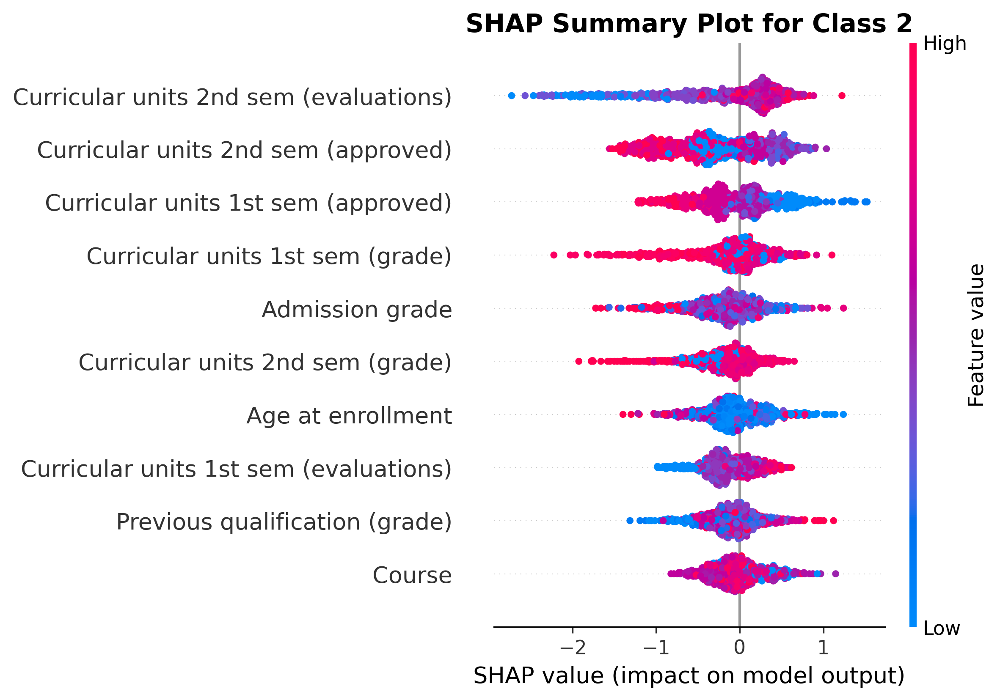

<Figure size 640x480 with 0 Axes>

In [ ]:
import shap
import matplotlib.pyplot as plt

# Assuming shap_values and X are already defined
n_classes = shap_values.shape[2]  # Number of classes

# Plot SHAP summary plot for each class
plt.figure(figsize=(10, 6), dpi=300)
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.size'] = 12
image1= shap.summary_plot(shap_values[:, :, 2], x_test, max_display=10, show=False)
plt.title(f"SHAP Summary Plot for Class {2}", fontweight='bold')
plt.show()
plt.savefig("shap_summary_class_2.png", bbox_inches="tight")

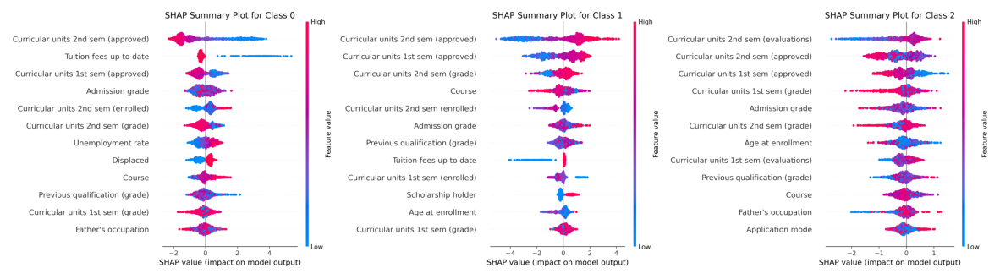

In [ ]:
import shap
import matplotlib.pyplot as plt
from PIL import Image

# Assuming shap_values and x_test are already defined
# shap_values shape: (n_samples, n_features, n_classes)
# x_test shape: (n_samples, n_features)

# Save individual SHAP summary plots
for i in range(3):  # Assuming 3 classes
    shap.summary_plot(shap_values[:, :, i], x_test, max_display=12, show=False)
    plt.title(f"SHAP Summary Plot for Class {i}")
    plt.savefig(f"shap_class_{i}.png", bbox_inches="tight", dpi=300)
    plt.close()

# Combine the saved images into one figure
images = [Image.open(f"shap_class_{i}.png") for i in range(3)]

# Calculate the total width and maximum height
total_width = sum(img.width for img in images)
max_height = max(img.height for img in images)

# Create a new blank image to hold the combined plots
combined_image = Image.new("RGB", (total_width, max_height))

# Paste each image side by side
x_offset = 0
for img in images:
    combined_image.paste(img, (x_offset, 0))
    x_offset += img.width

# Save the combined image
combined_image.save("combined_shap_plots.png")

# Display the combined image using matplotlib
plt.figure(figsize=(15, 5))
plt.imshow(combined_image)
plt.axis("off")  # Hide axes
plt.show()

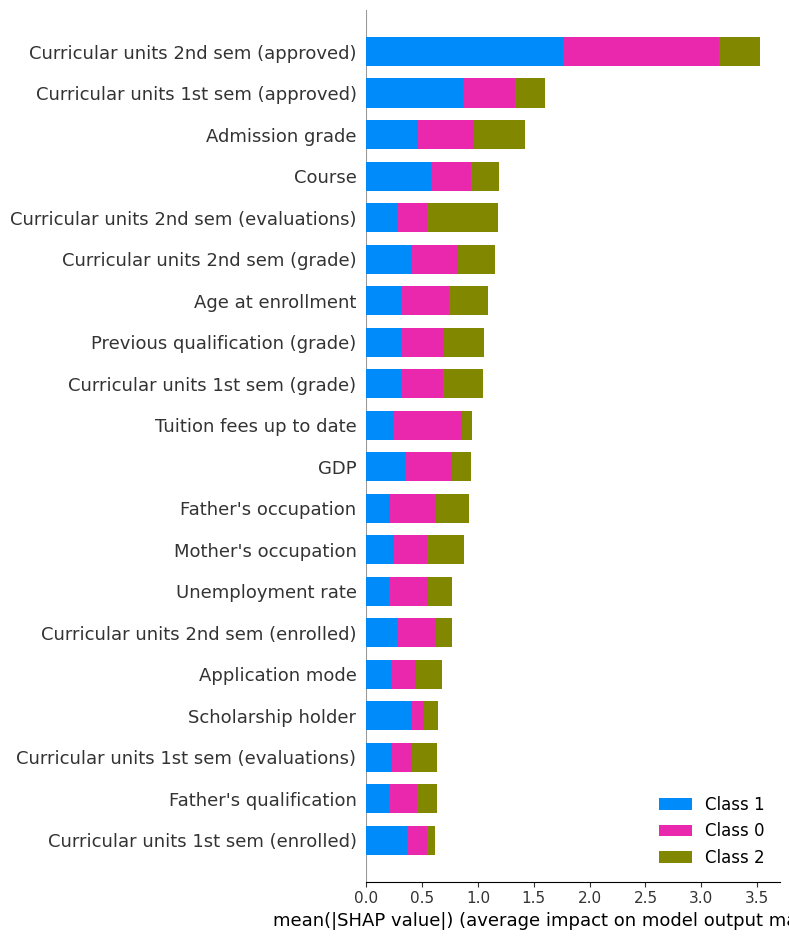

In [ ]:
explainer = shap.TreeExplainer(xgc)
shap_values = explainer.shap_values(x_test,approximate=True)
shap.summary_plot(shap_values, x_test, plot_type="bar")

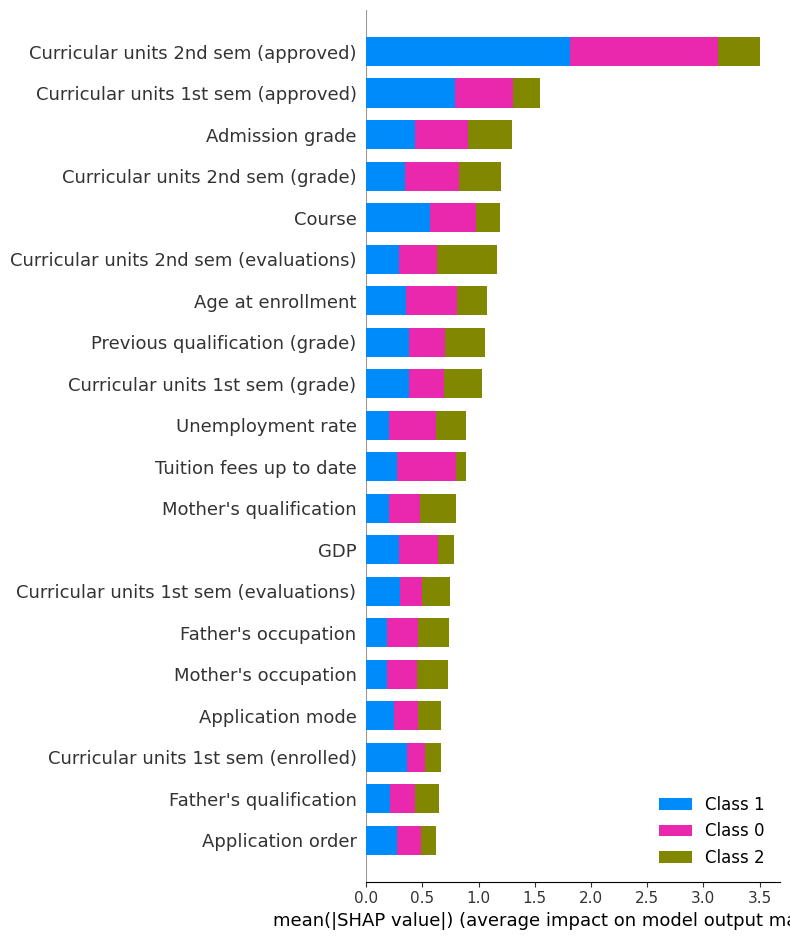

In [ ]:
explainer = shap.TreeExplainer(xgc)
shap_values = explainer.shap_values(x_test,approximate=True)
shap.summary_plot(shap_values, x_test, plot_type="bar")

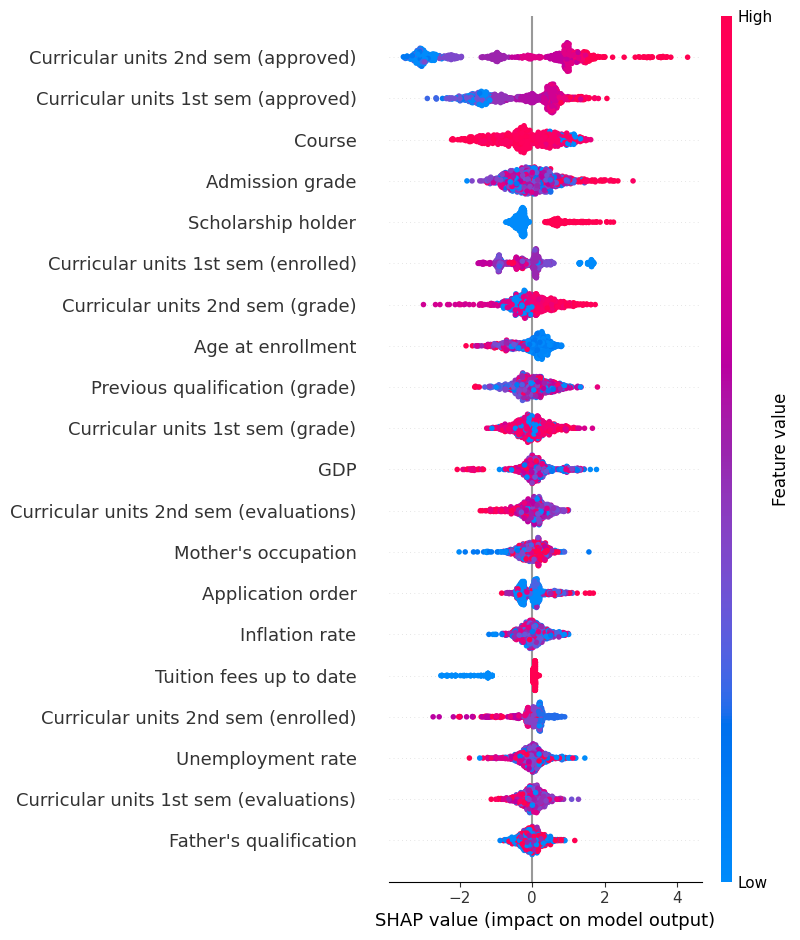

In [ ]:
shap.initjs()
explainer = shap.TreeExplainer(xgc)
shap_values = explainer.shap_values(x_test,approximate=True)
shap.summary_plot(shap_values[1], x_test)

In [ ]:
shap.initjs()
i = 8
shap.force_plot(explainer.expected_value[0], shap_values[0][i], x.values[i], feature_names = x.columns)